# Telecom Churn Analysis
## Data Analysis And Model Development

### Exploratory Data Analysis (EDA)
- Explore the dataset and understand the features:
    1. Missing values
    2. Duplicates
    3. Class imbalance in the "churn" column
- Perform statistical analysis and visualize:
    1. Plot distributions for key variables (age, estimated_salary, data_used, etc.)
    2. Plot churn rate across different categories (telecom_partner, gender, state)
    3. Bar plots, histograms, boxplots
    4. Correlation heatmap
- Generate key insights from the data

### Model building – Classification Model for Churn
- Preprocess the data:
    1. Encode categorical variables
    2. Normalize\scale numerical variables
    3. Handle class imbalance (if present)
- Try at least two classification models. (e.g. Random Forest, XGBoost etc.)
- Evaluate the model using cross validation.

### Model Evaluation
- Choos appropriate evaluation metrics:
    1.  Accuracy, Precision, Recall, F1_Score, ROC_AUC
- Visualizations:
    1. Confusion matrix
    2. ROC curve
    3. Feature importance plot
- Interpret which features are most important in predicting churn.


### Bonus points:
- Bonus 1: Hyperparameter tuning.
- Bonus 2: Identify overfitting or underfitting (if present).
- Bonus 3: Conver recall/precision into business outcomes.


In [54]:
import pandas as pd
import numpy as np
import os

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, learning_curve
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix, f1_score, recall_score, precision_score
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression

Detected logical cores: 16


## 1. Explore the dataset and understand the features

In [59]:
# load data
df = pd.read_csv(r"telecom_churn.csv")

In [60]:
df.head(2).style

,customer_id,telecom_partner,gender,age,state,city,pincode,date_of_registration,num_dependents,estimated_salary,calls_made,sms_sent,data_used,churn
0,1,Reliance Jio,F,25,Karnataka,Kolkata,755597,2020-01-01,4,124962,44,45,-361,0
1,2,Reliance Jio,F,55,Mizoram,Mumbai,125926,2020-01-01,2,130556,62,39,5973,0


Missing values

In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 243553 entries, 0 to 243552
Data columns (total 14 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   customer_id           243553 non-null  int64 
 1   telecom_partner       243553 non-null  object
 2   gender                243553 non-null  object
 3   age                   243553 non-null  int64 
 4   state                 243553 non-null  object
 5   city                  243553 non-null  object
 6   pincode               243553 non-null  int64 
 7   date_of_registration  243553 non-null  object
 8   num_dependents        243553 non-null  int64 
 9   estimated_salary      243553 non-null  int64 
 10  calls_made            243553 non-null  int64 
 11  sms_sent              243553 non-null  int64 
 12  data_used             243553 non-null  int64 
 13  churn                 243553 non-null  int64 
dtypes: int64(9), object(5)
memory usage: 26.0+ MB


Duplicates

In [91]:
df.duplicated().sum()

np.int64(0)

Class imbalance in the "churn" column

In [62]:
df.describe()

,customer_id,age,pincode,num_dependents,estimated_salary,calls_made,sms_sent,data_used,churn
count,243553.000000,243553.000000,243553.000000,243553.000000,243553.000000,243553.000000,243553.000000,243553.000000,243553.000000
mean,121777.000000,46.077609,549501.270541,1.997500,85021.137839,49.010548,23.945404,4993.186025,0.200478
std,70307.839393,16.444029,259808.860574,1.414941,37508.963233,29.453556,14.733575,2942.019547,0.400359
min,1.000000,18.000000,100006.000000,0.000000,20000.000000,-10.000000,-5.000000,-987.000000,0.000000
25%,60889.000000,32.000000,324586.000000,1.000000,52585.000000,24.000000,11.000000,2490.000000,0.000000
50%,121777.000000,46.000000,548112.000000,2.000000,84990.000000,49.000000,24.000000,4987.000000,0.000000
75%,182665.000000,60.000000,774994.000000,3.000000,117488.000000,74.000000,36.000000,7493.000000,0.000000
max,243553.000000,74.000000,999987.000000,4.000000,149999.000000,108.000000,53.000000,10991.000000,1.000000


In [64]:
# checking for negative calls
df[df['calls_made'] < 0][['telecom_partner', 'churn']].groupby(['telecom_partner'])['churn'].agg(['count', 'sum', 'mean'])

,count,sum,mean
telecom_partner,,,
Airtel,1721,339,0.196979
BSNL,1634,316,0.193390
Reliance Jio,1708,367,0.214871
Vodafone,1650,340,0.206061


In [65]:
#comparing it with positive calls
df[df['calls_made'] > 0][['telecom_partner', 'churn']].groupby(['telecom_partner'])['churn'].agg(['count', 'sum', 'mean'])

,count,sum,mean
telecom_partner,,,
Airtel,58843,12001,0.203949
BSNL,58747,11676,0.198751
Reliance Jio,59100,11787,0.199442
Vodafone,58805,11726,0.199405


In [66]:
#cheking the total 
df[df['calls_made'] < 0]['churn'].mean(), df[df['calls_made'] > 0]['churn'].mean(), df['churn'].mean()

(np.float64(0.20288991509012363),
 np.float64(0.20038642009384489),
 np.float64(0.20047792472275028))

In [68]:
# checking for negative sms
df[df['sms_sent'] < 0][['telecom_partner', 'churn']].groupby(['telecom_partner'])['churn'].agg(['count', 'sum', 'mean'])

,count,sum,mean
telecom_partner,,,
Airtel,1838,404,0.219804
BSNL,1842,378,0.205212
Reliance Jio,1840,392,0.213043
Vodafone,1855,362,0.195148


In [69]:
# comparing with positeve value
df[df['sms_sent'] > 0][['telecom_partner', 'churn']].groupby(['telecom_partner'])['churn'].agg(['count', 'sum', 'mean'])

,count,sum,mean
telecom_partner,,,
Airtel,58352,11845,0.202992
BSNL,58148,11518,0.198081
Reliance Jio,58579,11687,0.199508
Vodafone,58222,11631,0.199770


In [70]:
t = df[df['sms_sent'] < 0][['telecom_partner', 'churn']].groupby(['telecom_partner'])['churn'].agg(['mean']).rename(columns={'mean':'sms<0_rate'})\
.join(df[df['sms_sent'] > 0][['telecom_partner', 'churn']].groupby(['telecom_partner'])['churn'].agg(['mean']).rename(columns={'mean':'sms>0_rate'}))

In [71]:
t['diff_in_rate'] = t['sms<0_rate'] - t['sms>0_rate']
t['diff_in_pnt'] = t['diff_in_rate']/df['churn'].mean()

In [72]:
t

,sms<0_rate,sms>0_rate,diff_in_rate,diff_in_pnt
telecom_partner,,,,
Airtel,0.219804,0.202992,0.016812,0.083859
BSNL,0.205212,0.198081,0.007131,0.035570
Reliance Jio,0.213043,0.199508,0.013535,0.067514
Vodafone,0.195148,0.199770,-0.004622,-0.023053


In [73]:
# checking for negative data_used
df[df['data_used'] < 0][['telecom_partner', 'churn']].groupby(['telecom_partner'])['churn'].agg(['count', 'sum', 'mean'])

,count,sum,mean
telecom_partner,,,
Airtel,1543,330,0.213869
BSNL,1475,299,0.202712
Reliance Jio,1580,331,0.209494
Vodafone,1452,294,0.202479


In [74]:
# comparing with positeve value
df[df['data_used'] > 0][['telecom_partner', 'churn']].groupby(['telecom_partner'])['churn'].agg(['count', 'sum', 'mean'])

,count,sum,mean
telecom_partner,,,
Airtel,59357,12073,0.203396
BSNL,59247,11761,0.198508
Reliance Jio,59537,11901,0.199893
Vodafone,59348,11835,0.199417


In [75]:
# churn rate
df['churn'].mean() * 100

np.float64(20.047792472275027)

##  Perform statistical analysis and visualize

Plot distributions for key variables (age, estimated_salary, data_used, etc.)

In [102]:
numerical_df = df.select_dtypes(include=['int64', 'float64']).drop(['customer_id', 'churn', 'pincode'], axis=1)

num_columns = len(numerical_df.columns)
num_rows = (num_columns + 2) // 3  

# Create the subplot layout
fig = make_subplots(rows=num_rows, cols=3,  # Adjust number of columns (3 here for compactness)
                    subplot_titles=numerical_df.columns.tolist(),
                    vertical_spacing=0.2
                   )

# Loop over the numerical columns to add histograms to the subplots
for i, column in enumerate(numerical_df.columns):
    row = i // 3 + 1  # Calculate row number
    col = i % 3 + 1  # Calculate column number
    
    # Create histogram for each column
    fig.add_trace(
        go.Histogram(
            x=numerical_df[column],
            nbinsx=30,  # Number of bins
            histnorm='density',  # Normalize to density (like KDE)
            marker_color='blue'
        ),
        row=row, col=col
    )

# Update the layout with titles and axis labels
fig.update_layout(
    title='Numerical Features',
    showlegend=False,
    height=600,  # Adjust the height to fit all charts
    width=900,   # Adjust the width to fit all charts
)

fig.show()

Plot churn rate across different categories (telecom_partner, gender, state)

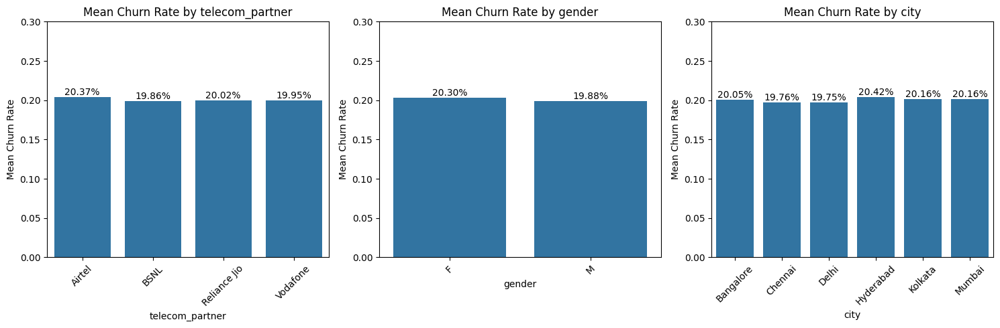

In [111]:
categorical_cols = ['telecom_partner', 'gender', 'city']
fig, axes = plt.subplots(1, len(categorical_cols), figsize=(5 * len(categorical_cols), 5))

for i, col in enumerate(categorical_cols):
    grouped = df.groupby(col)['churn'].mean().reset_index()
    # Plot
    sns.barplot(data=grouped, x=col, y='churn', ax=axes[i])
    axes[i].set_title(f'Mean Churn Rate by {col}')
    axes[i].set_ylabel('Mean Churn Rate')
    axes[i].set_xlabel(col)
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].set_ylim(0, 0.3)
    # Optional: display percentage on top of bars
    for p in axes[i].patches:
        axes[i].annotate(f"{p.get_height():.2%}", (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()


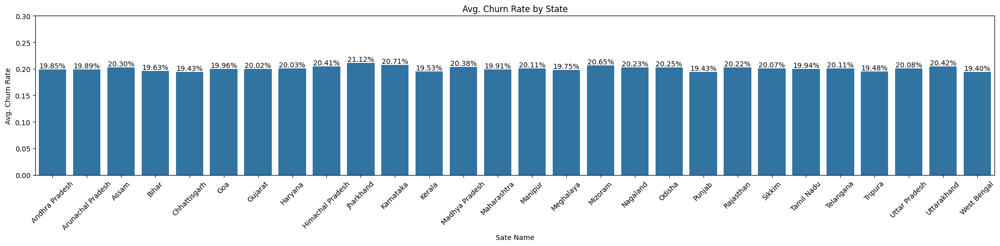

In [122]:
state = df.groupby('state')['churn'].mean().reset_index()

# Set up the plot
plt.figure(figsize=(20, 5))
sns.barplot(data=grouped, x='state', y='churn')

# Customize
plt.title('Avg. Churn Rate by State')
plt.ylabel('Avg. Churn Rate')
plt.xlabel('Sate Name')
plt.ylim(0, 0.3)
plt.xticks(rotation=45)

# Annotate bars with percentage labels
for p in plt.gca().patches:
    plt.gca().annotate(f"{p.get_height():.2%}", 
                       (p.get_x() + p.get_width() / 2., p.get_height()),
                       ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()


Bar plots, histograms, boxplots

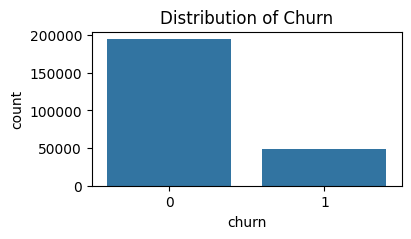

In [93]:
# churn distribution
plt.figure(figsize=(4, 2))
sns.countplot(data=df, x='churn')
plt.title('Distribution of Churn')
plt.show()

In [78]:
df['registration_month'] = pd.to_datetime(df['date_of_registration']).dt.month

In [97]:
month_df = df.groupby(['registration_month'])[['churn']].mean().reset_index()

In [98]:
month_df

,registration_month,churn
0,1,0.205538
1,2,0.196873
2,3,0.195729
3,4,0.201577
4,5,0.197226
5,6,0.201880
6,7,0.197180
7,8,0.204349
8,9,0.198710
9,10,0.199451


In [99]:
import plotly.express as px


# Create the bar chart
fig = px.bar(title='Monthly Based', x=month_df['registration_month'], y=month_df['churn'])

# Update the layout
fig.update_layout(
    xaxis_title='Month',
    yaxis_title='Churn Rate'
)

fig.show()

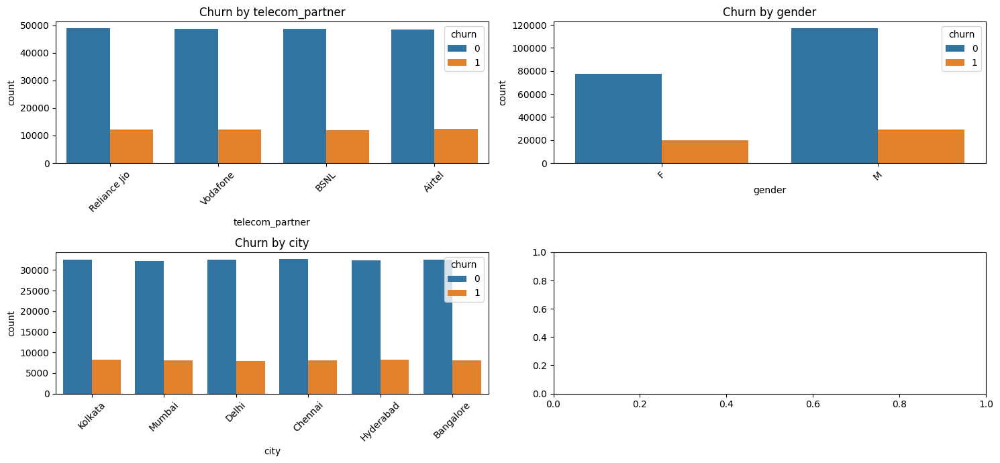

In [82]:
# Analyze categorical variables
categorical_cols = ['telecom_partner', 'gender', 'city']

fig, axes = plt.subplots(2, 2, figsize=(15, 7))
for i, col in enumerate(categorical_cols):
    sns.countplot(data=df, x=col, hue='churn', ax=axes[i//2, i%2])
    axes[i//2, i%2].set_title(f'Churn by {col}')
    axes[i//2, i%2].tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

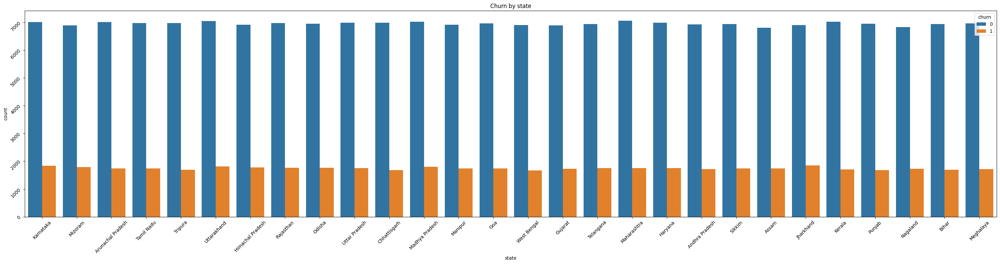

In [83]:
fig, axes = plt.subplots(figsize=(30, 8))
sns.countplot(data=df, x='state', hue='churn', ax=axes)
axes.set_title(f'Churn by state')
axes.tick_params(rotation=45)
plt.tight_layout()
plt.show()

In [103]:
numerical_df = df.select_dtypes(include=['int64', 'float64']).drop(['customer_id', 'churn', 'pincode'], axis=1)

num_columns = len(numerical_df.columns)
num_rows = (num_columns + 2) // 3  

# Create the subplot layout
fig = make_subplots(rows=num_rows, cols=3,  # Adjust number of columns (3 here for compactness)
                    subplot_titles=numerical_df.columns.tolist(),
                    vertical_spacing=0.2
                   )

# Loop over the numerical columns to add histograms to the subplots
for i, column in enumerate(numerical_df.columns):
    row = i // 3 + 1  # Calculate row number
    col = i % 3 + 1  # Calculate column number
    
    # Create histogram for each column
    fig.add_trace(
        go.Histogram(
            x=numerical_df[column],
            nbinsx=30,  # Number of bins
            histnorm='density',  # Normalize to density (like KDE)
            marker_color='blue'
        ),
        row=row, col=col
    )

# Update the layout with titles and axis labels
fig.update_layout(
    title='Numerical Features',
    showlegend=False,
    height=600,  # Adjust the height to fit all charts
    width=900,   # Adjust the width to fit all charts
)

fig.show()

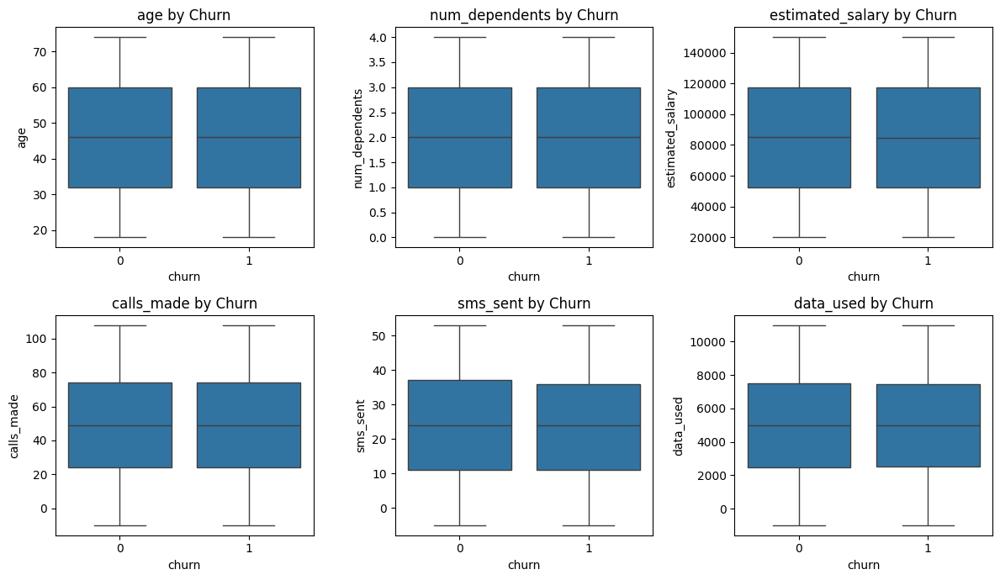

In [84]:
numerical_cols = ['age', 'num_dependents', 'estimated_salary', 'calls_made', 'sms_sent', 'data_used']

fig, axes = plt.subplots(2, 3, figsize=(12, 7))
for i, col in enumerate(numerical_cols):
    sns.boxplot(data=df, x='churn', y=col, ax=axes[i//3, i%3])
    axes[i//3, i%3].set_title(f'{col} by Churn')
plt.tight_layout()
plt.show()

Correlation heatmap

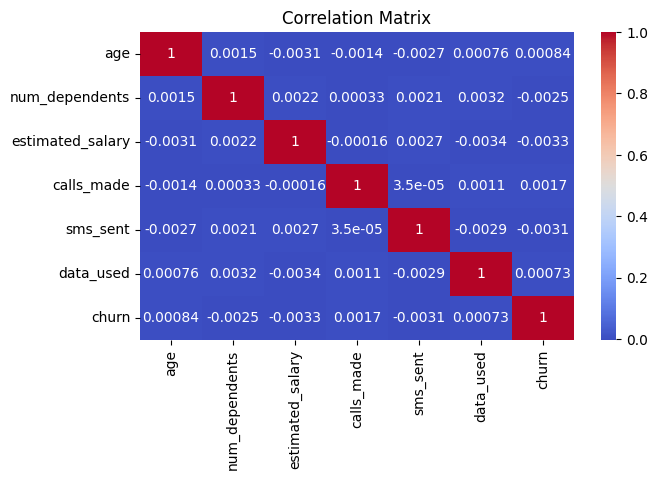

In [100]:
correlation = df[numerical_cols + ['churn']].corr()
plt.figure(figsize=(7, 4))
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [86]:
df['age_group'] = pd.cut(df['age'], bins=[0, 25, 35, 45, 55, 100], labels=['18-25', '26-35', '36-45', '46-55', '55+'])
age_churn = df.groupby('age_group')['churn'].agg(['count', 'sum', 'mean']).round(4)
age_churn

C:\Users\krist\AppData\Local\Temp\ipykernel_31280\1381639018.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,count,sum,mean
age_group,,,
18-25,34026,6784,0.1994
26-35,42302,8485,0.2006
36-45,42649,8605,0.2018
46-55,43005,8584,0.1996
55+,81571,16369,0.2007


C:\Users\krist\AppData\Local\Temp\ipykernel_31280\1692040241.py:7: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Text(0, 0.5, 'Churn Rate')

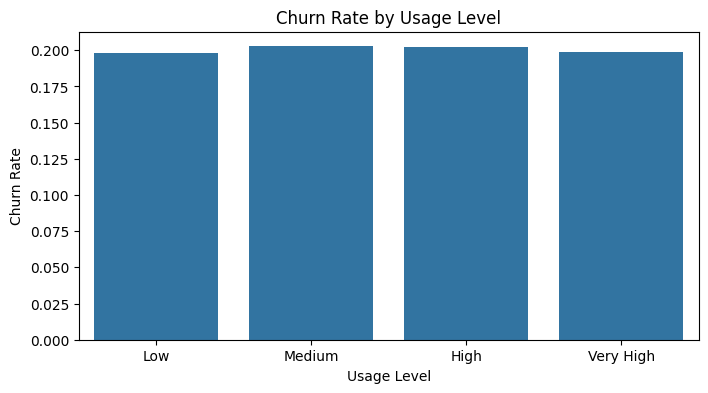

In [87]:
usage_cols = ['calls_made', 'sms_sent', 'data_used']
df['usage_level'] = df[usage_cols].mean(axis=1)
df['usage_category'] = pd.qcut(df['usage_level'], q=4, labels=['Low', 'Medium', 'High', 'Very High'])


plt.figure(figsize=(8, 4))
ax = sns.barplot(data=df.groupby('usage_category')[['churn']].mean().reset_index(), x='usage_category', y='churn')
plt.title('Churn Rate by Usage Level')
plt.xlabel('Usage Level')
plt.ylabel('Churn Rate')

# Telecom Churn Analysis
## Data Analysis And Model Development

### Exploratory Data Analysis (EDA)
- Explore the dataset and understand the features:
    1. Missing values
    2. Duplicates
    3. Class imbalance in the "churn" column
- Perform statistical analysis and visualize:
    1. Plot distributions for key variables (age, estimated_salary, data_used, etc.)
    2. Plot churn rate across different categories (telecom_partner, gender, state)
    3. Bar plots, histograms, boxplots
    4. Correlation heatmap
- Generate key insights from the data

### Model building – Classification Model for Churn
- Preprocess the data:
    1. Encode categorical variables
    2. Normalize\scale numerical variables
    3. Handle class imbalance (if present)
- Try at least two classification models. (e.g. Random Forest, XGBoost etc.)
- Evaluate the model using cross validation.

### Model Evaluation
- Choos appropriate evaluation metrics:
    1.  Accuracy, Precision, Recall, F1_Score, ROC_AUC
- Visualizations:
    1. Confusion matrix
    2. ROC curve
    3. Feature importance plot
- Interpret which features are most important in predicting churn.


### Bonus points:
- Bonus 1: Hyperparameter tuning.
- Bonus 2: Identify overfitting or underfitting (if present).
- Bonus 3: Conver recall/precision into business outcomes.


## Model building – Classification Model for Churn

### Preprocess the data

Encode categorical variables

In [174]:
# load data
df = pd.read_csv(r"telecom_churn.csv")

In [175]:
# Check class distribution
df['churn'].value_counts(normalize=True)

churn
0    0.799522
1    0.200478
Name: proportion, dtype: float64

In [180]:
df.head(2)

,telecom_partner,gender,age,state,city,pincode,date_of_registration,num_dependents,estimated_salary,calls_made,sms_sent,data_used,churn
0,Reliance Jio,F,25,Karnataka,Kolkata,755597,2020-01-01,4,124962,44,45,-361,0
1,Reliance Jio,F,55,Mizoram,Mumbai,125926,2020-01-01,2,130556,62,39,5973,0


In [177]:
#droping customer_id column 
df.drop('customer_id', axis=1, inplace=True)

In [188]:
df['date_of_registration'] = pd.to_datetime(df['date_of_registration'])

# Calculate reference date (end of the dataset or current date)
reference_date = df['date_of_registration'].max()

# Create time-based features
df['tenure_days'] =  df['date_of_registration'].dt.day
df['registration_year'] = df['date_of_registration'].dt.year
df['registration_month'] = df['date_of_registration'].dt.month

# Drop the original date column 
df = df.drop('date_of_registration', axis=1)

In [189]:
# Separate features and target
X = df.drop('churn', axis=1)
y = df['churn']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Normalize\scale numerical variables

In [191]:
# categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns

label_encoders = {}
scaler = StandardScaler()

# Encode categorical variables
X_train_encoded = X_train.copy()
X_test_encoded = X_test.copy()

for col in categorical_cols:
    label_encoders[col] = LabelEncoder()
    X_train_encoded[col] = label_encoders[col].fit_transform(X_train[col])
    X_test_encoded[col] = label_encoders[col].transform(X_test[col])

# Scale numerical variables
X_train_encoded[numerical_cols] = scaler.fit_transform(X_train_encoded[numerical_cols])
X_test_encoded[numerical_cols] = scaler.transform(X_test_encoded[numerical_cols])

In [38]:
# Handle class imbalance using SMOTE
smote = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train_encoded, y_train)

print("Class distribution after SMOTE:")
print(pd.Series(y_train_balanced).value_counts(normalize=True))

Class distribution after SMOTE:
churn
1    0.5
0    0.5
Name: proportion, dtype: float64


In [39]:
rf_model = RandomForestClassifier(n_estimators=1000, random_state=42, n_jobs=-1)
xgb_model = XGBClassifier(random_state=42, n_jobs=-1)
lr_model = LogisticRegression(max_iter=1000, random_state=42, n_jobs=-1)

In [40]:
def evaluate_model(model, X, y, model_name):
    # Perform cross-validation
    cv_scores = cross_val_score(model, X, y, cv=5, scoring='accuracy')
    
    print(f"\n{model_name} Cross-Validation Results:")
    print(f"Mean CV Accuracy: {cv_scores.mean():.4f} (+/- {cv_scores.std() * 2:.4f})")
    
    # Train model on full training set
    model.fit(X, y)
    
    # Make predictions on test set
    y_pred = model.predict(X_test_encoded)
    
    # Print classification report
    print(f"\n{model_name} Classification Report:")
    print(classification_report(y_test, y_pred))
    
    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
    plt.title(f'{model_name} Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()
    
    return model


Random Forest Cross-Validation Results:
Mean CV Accuracy: 0.8578 (+/- 0.2775)

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.97      0.88     38928
           1       0.18      0.03      0.05      9783

    accuracy                           0.78     48711
   macro avg       0.49      0.50      0.46     48711
weighted avg       0.67      0.78      0.71     48711



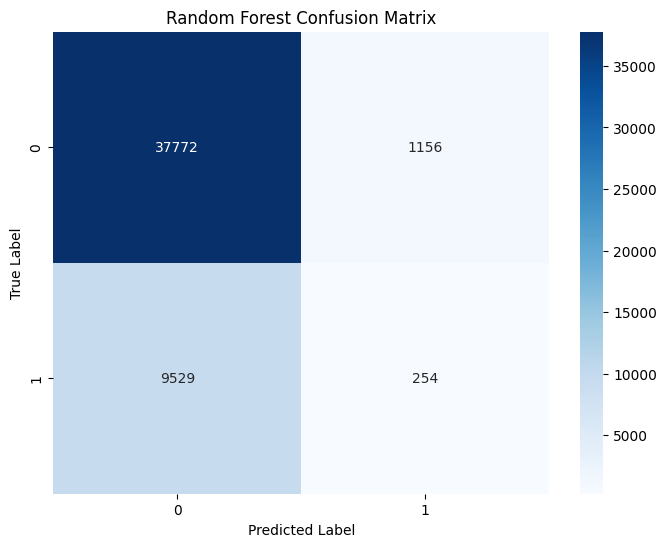

CPU times: total: 4h 34min 43s
Wall time: 19min 27s


In [41]:
%%time
rf_model = evaluate_model(rf_model, X_train_balanced, y_train_balanced, "Random Forest")


XGBoost Cross-Validation Results:
Mean CV Accuracy: 0.8550 (+/- 0.3671)

XGBoost Classification Report:
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     38928
           1       0.30      0.00      0.00      9783

    accuracy                           0.80     48711
   macro avg       0.55      0.50      0.45     48711
weighted avg       0.70      0.80      0.71     48711



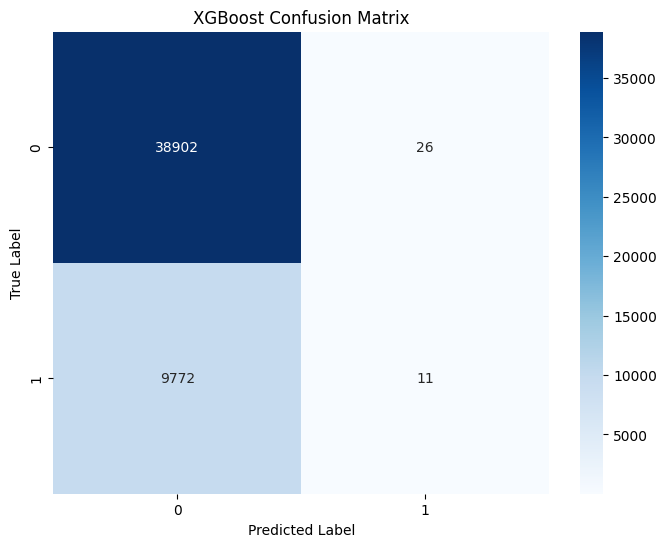

CPU times: total: 1min 2s
Wall time: 5.53 s


In [42]:
%%time
xgb_model = evaluate_model(xgb_model, X_train_balanced, y_train_balanced, "XGBoost")


Logistic Regression Cross-Validation Results:
Mean CV Accuracy: 0.5758 (+/- 0.0741)

Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.58      0.67     38928
           1       0.21      0.43      0.28      9783

    accuracy                           0.55     48711
   macro avg       0.50      0.51      0.48     48711
weighted avg       0.68      0.55      0.59     48711



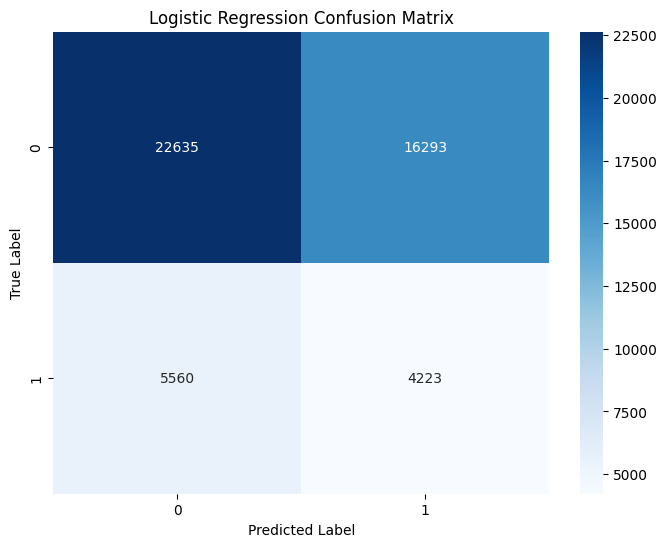

CPU times: total: 922 ms
Wall time: 1min 1s


In [43]:
%%time
lr_model = evaluate_model(lr_model, X_train_balanced, y_train_balanced, "Logistic Regression")


Plotting feature importance...


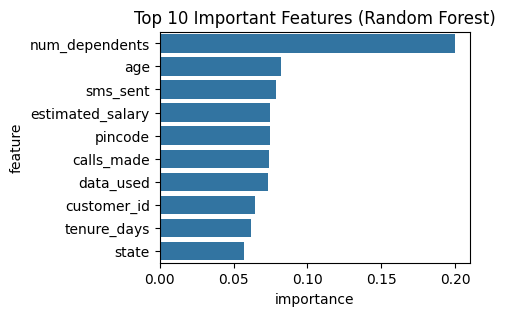

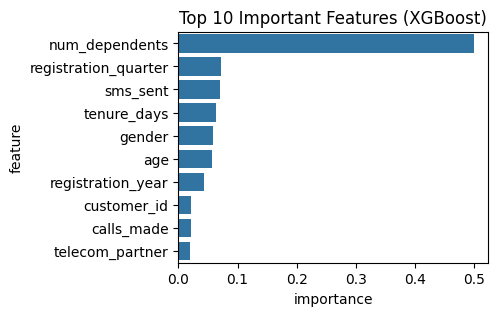

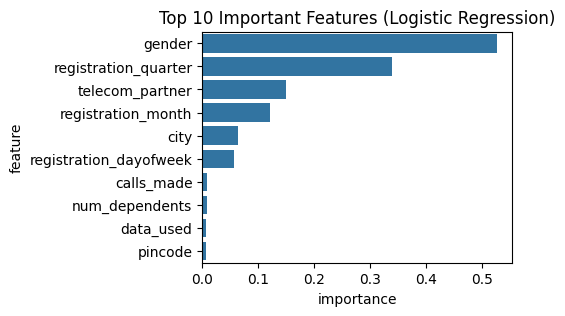

In [44]:
def plot_feature_importance(model, model_name):
    if isinstance(model, LogisticRegression):
        importances = np.abs(model.coef_[0])  # absolute coefficients
    else:
        importances = model.feature_importances_
    
    feature_importance = pd.DataFrame({
        'feature': X_train_encoded.columns,
        'importance': importances
    }).sort_values('importance', ascending=False)
    
    plt.figure(figsize=(4, 3))
    sns.barplot(x='importance', y='feature', data=feature_importance.head(10))
    plt.title(f'Top 10 Important Features ({model_name})')
    plt.show()

# Plot feature importance for all models
print("\nPlotting feature importance...")
plot_feature_importance(rf_model, "Random Forest")
plot_feature_importance(xgb_model, "XGBoost")
plot_feature_importance(lr_model, "Logistic Regression")

In [45]:
# Compare model performances
models = {
    'Random Forest': rf_model,
    'XGBoost': xgb_model,
    'Logistic Regression': lr_model
}

# Create comparison table
results = []
for name, model in models.items():
    cv_scores = cross_val_score(model, X_train_balanced, y_train_balanced, cv=5, scoring='accuracy', n_jobs=-1)
    results.append({
        'Model': name,
        'Mean CV Accuracy': cv_scores.mean(),
        'CV Std Dev': cv_scores.std()
    })

comparison_df = pd.DataFrame(results)
print("\nModel Comparison:")
comparison_df


Model Comparison:


,Model,Mean CV Accuracy,CV Std Dev
0,Random Forest,0.857810,0.138739
1,XGBoost,0.855009,0.183554
2,Logistic Regression,0.575794,0.037062


In [46]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Simple grid with fewer combinations
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20],
}

# Initialize model
rf = RandomForestClassifier(random_state=42, n_jobs=-1)

# Grid search with 3-fold cross-validation
grid_search = GridSearchCV(rf, param_grid, cv=3, scoring='f1', n_jobs=-1)

# Fit model
grid_search.fit(X_train_balanced, y_train_balanced)

# Results
print("Best parameters:", grid_search.best_params_)
print("Best F1 score:", grid_search.best_score_)
best_model = grid_search.best_estimator_

Best parameters: {'max_depth': 20, 'n_estimators': 100}
Best F1 score: 0.7336459100148823


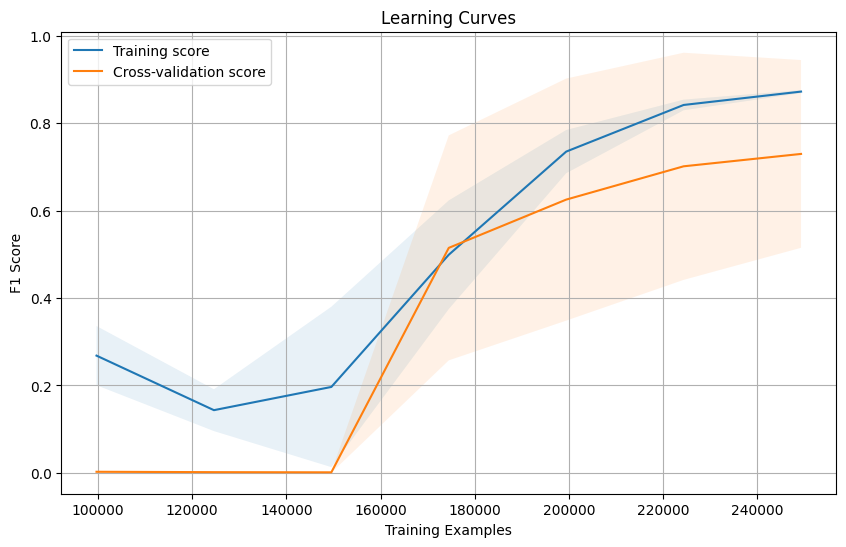

In [47]:
def plot_learning_curves(model, X, y):
    train_sizes, train_scores, val_scores = learning_curve(
        model, X, y, cv=5, n_jobs=-1, 
        train_sizes=np.linspace(0.1, 1.0, 10),
        scoring='f1'
    )
    
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)
    val_std = np.std(val_scores, axis=1)
    
    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_mean, label='Training score')
    plt.plot(train_sizes, val_mean, label='Cross-validation score')
    
    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1)
    plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.1)
    
    plt.xlabel('Training Examples')
    plt.ylabel('F1 Score')
    plt.title('Learning Curves')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

# Plot learning curves
plot_learning_curves(best_model, X_train_balanced, y_train_balanced)